In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="whitegrid", context="notebook")
sns.set_palette(palette="muted")
plt.rcParams["figure.dpi"] = 500
plt.rcParams["savefig.dpi"] = 800
plt.rcParams["font.size"] = 12
plt.rcParams["lines.linewidth"] = 1.5

In [2]:
from pathlib import Path

BASE_DIR = Path.cwd().parent
DATA_PATH = BASE_DIR / "data" / "raw" / "train.csv"

data = pd.read_csv(DATA_PATH, sep=';')

In [4]:
data.shape

(1170511, 29)

In [3]:
data.sample(10)

,WELL,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,GROUP,FORMATION,CALI,RSHA,RMED,...,ROP,DTS,DCAL,DRHO,MUDWEIGHT,RMIC,ROPA,RXO,FORCE_2020_LITHOFACIES_LITHOLOGY,FORCE_2020_LITHOFACIES_CONFIDENCE
717471,33/9-1,920.146000,437780.34375,6791573.5,-895.145996,HORDALAND GP.,Utsira Fm.,NaN,NaN,1.528099,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65000,1.0
504103,30/3-3,2008.342000,497350.31250,6737317.5,-1986.240967,ROGALAND GP.,Sele Fm.,17.895840,2.022263,1.303514,...,NaN,NaN,NaN,0.000098,NaN,NaN,NaN,2.020535,65000,3.0
626649,31/3-3,1221.186000,545900.75000,6744777.5,-1194.308838,ROGALAND GP.,Lista Fm.,NaN,0.826435,0.826491,...,NaN,NaN,NaN,0.116246,NaN,NaN,NaN,NaN,65000,1.0
402329,25/7-2,3852.384000,454864.78125,6570990.5,-3824.556152,CROMER KNOLL GP.,Roedby Fm.,12.415968,7.173405,3.449790,...,4.328452,NaN,0.1641,-0.002389,NaN,5.728088,NaN,6.018536,65000,1.0
998542,35/11-12,621.714000,520557.40625,6777351.0,-597.696838,NORDLAND GP.,NaN,NaN,NaN,3.301090,...,75.447136,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65030,3.0
731476,33/9-1,3052.250000,437780.34375,6791573.5,-3027.250000,DUNLIN GP.,Statfjord Fm.,8.656675,NaN,3.309596,...,NaN,NaN,NaN,-0.020132,NaN,NaN,NaN,NaN,30000,1.0
263049,25/2-7,201.098001,479890.56250,6641111.5,-176.095459,NORDLAND GP.,NaN,23.815338,1.828927,1.828927,...,NaN,NaN,NaN,0.008836,NaN,NaN,NaN,NaN,65030,2.0
997402,35/11-12,429.738000,520555.37500,6777350.0,-405.734955,NORDLAND GP.,NaN,NaN,NaN,2.942191,...,57.059223,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65030,3.0
825595,34/11-2 S,2678.632000,466820.28125,6788233.5,-2653.132568,SHETLAND GP.,Kyrre Fm.,17.983187,NaN,1.594830,...,NaN,NaN,NaN,-0.004000,NaN,NaN,14.5,-999.000000,65000,1.0
200845,17/11-1,1548.985016,520153.18750,6452287.5,-1521.984985,CROMER KNOLL GP.,Roedby Fm.,13.741438,0.669130,1.809527,...,79.411797,NaN,NaN,0.058621,1.198264,NaN,NaN,NaN,65000,1.0


**Метаданные**

| Столбец | Описание |
| :--- | :--- |
| `WELL` | Название скважины |
| `DEPTH_MD` | Измеренная глубина (Measured Depth) |
| `X_LOC` | Координата X в системе UTM |
| `Y_LOC` | Координата Y в системе UTM |
| `Z_LOC` | Абсолютная глубина (TVD) |
| `GROUP` | Литостратиграфическая группа по классификации NPD |
| `FORMATION` | Литостратиграфическая формация по классификации NPD |

**Каротажные кривые**

Данные содержат кривые ГИС, например:

| Кривая | Расшифровка |
| :--- | :--- |
| `BS` | Диаметр долота (Bit Size) |
| `CALI` | Каверномер (Caliper) |
| `RDEP` | Глубокое удельное сопротивление (Deep Resistivity) |
| `RHOB` | Объёмная плотность (Bulk Density) |
| `GR` | Гамма-каротаж (сырые данные) |
| `SGR` | Спектральный гамма-каротаж (Spectral Gamma Ray) |
| `RMED` | Среднее удельное сопротивление (Medium Resistivity) |
| `ROP` | Скорость проходки (Rate of Penetration) |
| `NPHI` | Нейтронная пористость (Neutron Porosity) |
| `PEF` | Фактор фотоэлектрического поглощения (Photoelectric Absorption Factor) |
| `RSHA` | Малоглубинное удельное сопротивление (Shallow Resistivity) |
| `DTS` | Акустический каротаж (поперечная волна, Shear Slowness) |
| `DTC` | Акустический каротаж (продольная волна, Compressional Slowness) |

**Данные интерпретации**

| Столбец | Описание |
| :--- | :--- |
| `FORCE_2020_LITHOFACIES_LITHOLOGY` | Метка класса литологии |
| `FORCE_2020_LITHOFACIES_CONFIDENCE` | Степень достоверности интерпретации литологии (1 — высокая, 2 — средняя, 3 — низкая) |

Наличие столбца `WELL` позволяет разделять данные по отдельным скважинам. Это необходимо для подходов, использующих «скользящее окно», где признаки машинного обучения опираются на нелокальную (контекстную) информацию.

`FORCE_2020_LITHOFACIES_LITHOLOGY` — target 🎯

`FORCE_2020_LITHOFACIES_LITHOLOGY` – contains the interpretation. Each number corresponds to a lithology class, given by the following list:

* 30000: Sandstone — Песчаник.
* 65030: Sandstone/Shale — Песчаник / Глинистый сланец (переслаивание или смешанная порода).
* 65000: Shale — Глинистый сланец (аргиллит).
* 80000: Marl — Мергель.
* 74000: Dolomite — Доломит.
* 70000: Limestone — Известняк.
* 70032: Chalk — Мел.
* 88000: Halite — Галит (каменная соль).
* 86000: Anhydrite — Ангидрит.
* 99000: Tuff — Туф.
* 90000: Coal — Уголь.
* 93000: Basement — Фундамент (кристаллические породы основания).

Ценность пород определяется их ролью в формировании месторождения:

*Коллекторы (Reservoirs):*
* Песчаник (Sandstone) и Известняк (Limestone) являются наиболее ценными, так как обладают способностью хранить и пропускать через себя углеводороды (нефть и газ). Их обнаружение напрямую влияет на оценку экономической жизнеспособности скважины
* Доломит (Dolomite) и Мел (Chalk) также могут выступать в роли коллекторов в зависимости от их пористости

*Покрышки (Seals/Cap Rocks):*
* Глинистый сланец (Shale), Ангидрит (Anhydrite) и Галит (Halite) критически важны, так как они непроницаемы. Они удерживают нефть в коллекторе, не давая ей просочиться на поверхность. 

*Маркеры и особые условия:*
* Уголь (Coal) часто служит четким геологическим маркером при корреляции разрезов скважин.
* Фундамент (Basement) обозначает нижнюю границу осадочного чехла, глубже которой поиск углеводородов обычно не ведется

In [5]:
lithology_keys = {
    30000: "Sandstone",
    65030: "Sandstone/Shale",
    65000: "Shale",
    80000: "Marl",
    74000: "Dolomite",
    70000: "Limestone",
    70032: "Chalk",
    88000: "Halite",
    86000: "Anhydrite",
    99000: "Tuff",
    90000: "Coal",
    93000: "Basement",
}

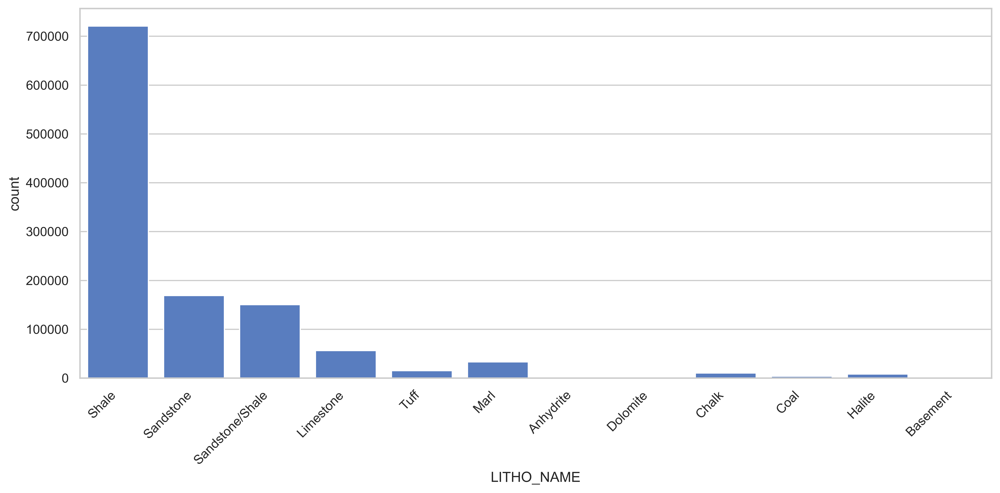

In [7]:
data["LITHO_NAME"] = data["FORCE_2020_LITHOFACIES_LITHOLOGY"].map(lithology_keys)

fig, ax = plt.subplots(figsize=(12, 6))
sns_plot = sns.countplot(data=data, x="LITHO_NAME")
sns_plot.set_xticks(sns_plot.get_xticks())
sns_plot.set_xticklabels(sns_plot.get_xticklabels(), rotation=45, ha="right")
fig = sns_plot.get_figure()
fig.tight_layout()

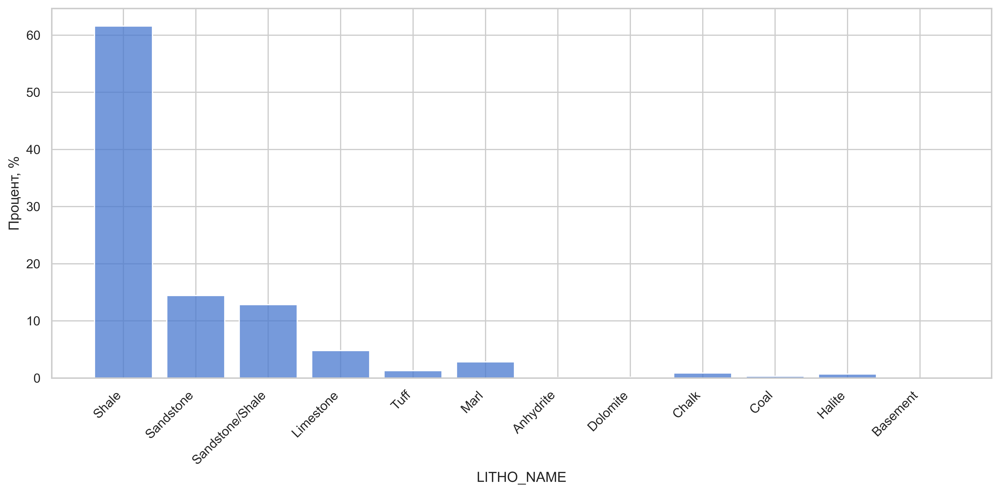

In [8]:
fig, ax = plt.subplots(figsize=(12, 6))

sns_plot = sns.histplot(
    data=data,
    x="LITHO_NAME",
    stat="percent",
    discrete=True,
    shrink=0.8,
    ax=ax,
    )

sns_plot.set_xticks(sns_plot.get_xticks())
sns_plot.set_xticklabels(sns_plot.get_xticklabels(), rotation=45, ha="right")
sns_plot.set_ylabel("Процент, %")
fig.tight_layout()

### Распределение литологических классов

Класс `Shale` доминирует ~62% от общего количества. 
Второй и третий по величине классы — `Sandstone` (песчаник, ~14%) и `Sandstone/Shale` (переслаивание, ~13%).
Все остальные классы (`Limestone`, `Marl`, `Tuff`, `Chalk`, `Halite`, `Basement` и др.) в сумме занимают менее 10%.

**Summary**
* Модель будет сильно смещена в сторону предсказания "Shale" (high class imbalance).
* Обязательно потребуется использование методов борьбы с дисбалансом: типа SMOTE, взвешивание классов, undersampling for shale; f1-macro (weighted f1) score, roc-auc. 
* Можно попробовать Focal-loss или объединять minor классы

Рассмотрим пропущенные значения:

In [9]:
d = {'amount':data.isna().sum(), 'percent': data.isna().sum()/len(data)}
missing = pd.DataFrame(d).sort_values("percent")

missing

,amount,percent
WELL,0,0.000000
FORCE_2020_LITHOFACIES_LITHOLOGY,0,0.000000
GR,0,0.000000
LITHO_NAME,0,0.000000
DEPTH_MD,0,0.000000
FORCE_2020_LITHOFACIES_CONFIDENCE,179,0.000153
GROUP,1278,0.001092
Z_LOC,10775,0.009205
Y_LOC,10775,0.009205
X_LOC,10775,0.009205


In [10]:
import missingno as msno

msno.bar(data)

<Axes: >

### Анализ пропусков

**Признаки с высокой полнотой**

*Full:*
* `WELL`
* `DEPTH_MD`
* `GR`
* `FORCE_2020_LITHOFACIES_LITHOLOGY`

*Less, than 10% missings*:
* `CALI`
* `DTC`
* `RMED`
* `RDEP`
* `X, Y, Z _LOC`
* `GROUP`
* `FORCE_2020_LITHOFACIES_CONFIDENCE`

**Потенциально проблемные признаки**

*С высоким процентом пропусков:*

*More than 80% missings*
* `ROPA`
* `RMIC`
* `DTS`
* `SGR`

*Сильно пропущенные признаки:*

*More than 50% missings*
* `ROP`
* `RXO`
* `MUDWEIGHT`
* `DCAL`


In [11]:
import ipywidgets as widgets
from ipywidgets import interactive, interact

@interact
def data_well_view(WELL=""):
    return data[data["WELL"] == WELL]

interactive(children=(Text(value='', description='WELL'), Output()), _dom_classes=('widget-interact',))

In [ ]:
def plot_well(w):
    fig, axs = plt.subplots(1, len(w.columns) - 9, sharey=True)
    fig.set_size_inches(20, np.round(len(w) / 750))
    plt.xticks(rotation=45, fontsize=8)
    for ic, col in enumerate(
        set(w.columns)
        - set(
            [
                "DEPTH_MD",
                "FORCE_2020_LITHOFACIES_LITHOLOGY",
                "FORCE_2020_LITHOFACIES_CONFIDENCE",
                "WELL",
                "GROUP",
                "FORMATION",
                "X_LOC",
                "Y_LOC",
                "Z_LOC",
            ]
        )
    ):
        axs[ic].plot(w[col], w["DEPTH_MD"])
        axs[ic].set_xlabel(col)
    axs[0].set_ylim(w["DEPTH_MD"].values[-1], w["DEPTH_MD"].values[0])
    plt.show()


def well_plot_view(WELL=""):
    return plot_well(data.loc[data["WELL"] == WELL])


well_items = data["WELL"].unique()
well_select = widgets.Select(options=well_items)
interactive(well_plot_view, WELL=well_select)

interactive(children=(Select(description='WELL', options=('15/9-13', '15/9-15', '15/9-17', '16/1-2', '16/1-6 A…

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1170511 entries, 0 to 1170510
Data columns (total 30 columns):
 #   Column                             Non-Null Count    Dtype  
---  ------                             --------------    -----  
 0   WELL                               1170511 non-null  object 
 1   DEPTH_MD                           1170511 non-null  float64
 2   X_LOC                              1159736 non-null  float64
 3   Y_LOC                              1159736 non-null  float64
 4   Z_LOC                              1159736 non-null  float64
 5   GROUP                              1169233 non-null  object 
 6   FORMATION                          1033517 non-null  object 
 7   CALI                               1082634 non-null  float64
 8   RSHA                               630650 non-null   float64
 9   RMED                               1131518 non-null  float64
 10  RDEP                               1159496 non-null  float64
 11  RHOB                    

In [14]:
num_data = data.select_dtypes('float64', 'int64')

In [15]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
DEPTH_MD,1170511.0,2.184087e+03,997.182105,1.360860e+02,1.418597e+03,2.076605e+03,2.864393e+03,5.436632e+03
X_LOC,1159736.0,4.856310e+05,34556.414531,4.268988e+05,4.547996e+05,4.769203e+05,5.201532e+05,5.726328e+05
Y_LOC,1159736.0,6.681276e+06,128152.434683,6.406641e+06,6.591327e+06,6.737311e+06,6.784886e+06,6.856661e+06
Z_LOC,1159736.0,-2.138527e+03,970.942584,-5.395563e+03,-2.811502e+03,-2.042785e+03,-1.391866e+03,-1.110860e+02
CALI,1082634.0,1.318568e+01,3.798907,2.344000e+00,9.429712e+00,1.255575e+01,1.671075e+01,2.827900e+01
RSHA,630650.0,1.069466e+01,100.642597,1.000000e-04,8.541203e-01,1.399020e+00,3.099348e+00,2.193905e+03
RMED,1131518.0,4.986978e+00,54.672687,-8.418695e-03,9.140862e-01,1.443584e+00,2.680930e+00,1.988616e+03
RDEP,1159496.0,1.069103e+01,113.948005,3.170056e-02,9.102396e-01,1.439000e+00,2.557220e+00,1.999887e+03
RHOB,1009242.0,2.284987e+00,0.253284,7.209712e-01,2.092203e+00,2.321228e+00,2.488580e+00,3.457820e+00
GR,1170511.0,7.091370e+01,34.231486,1.092843e-01,4.762722e+01,6.836763e+01,8.903551e+01,1.076964e+03


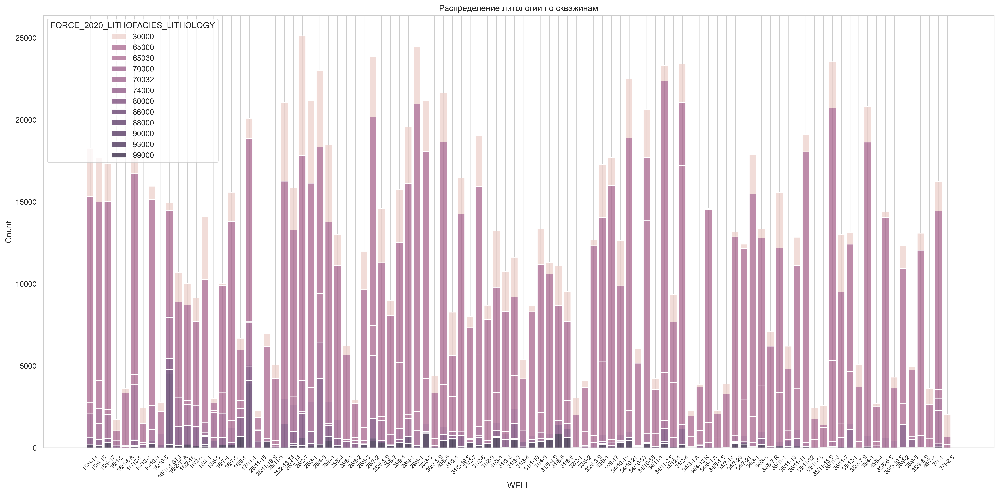

In [16]:
plt.figure(figsize=(20, 10))

sns.histplot(
    data=data,
    x="WELL",
    hue="FORCE_2020_LITHOFACIES_LITHOLOGY",
    multiple="stack",
    shrink=0.8,
)

plt.xticks(rotation=45, fontsize=8)
plt.title("Распределение литологии по скважинам")
plt.tight_layout()
plt.show()

У каждой скважины своя литология, поэтому важно разделить данные не случайным образом, а использовать, например, group k-fold (по `WELL`). 

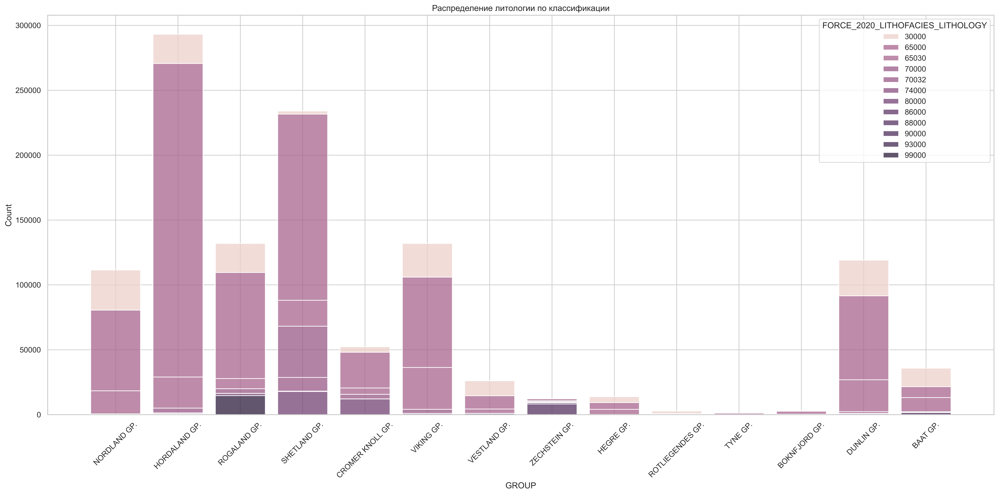

In [17]:
plt.figure(figsize=(20, 10))

sns.histplot(
    data=data,
    x="GROUP",
    hue="FORCE_2020_LITHOFACIES_LITHOLOGY",
    multiple="stack",
    shrink=0.8,
)

plt.xticks(rotation=45)
plt.title("Распределение литологии по классификации")
plt.tight_layout()
plt.show()

In [18]:
kde_cols = ["DEPTH_MD", 'X_LOC', 'Y_LOC', 'Z_LOC', 'CALI', 'RHOB', 'GR', 'SGR', 'NPHI', 'DTC', 'SP', 'DTS']

,Признак,Эксцесс,Асимметрия,Пик,Среднее,Медиана,25-й перцентиль,75-й перцентиль,99-й перцентиль,Распределение,Вывод
0,DEPTH_MD,-0.39,0.41,1950.69,2184.09,2076.60,1418.60,2864.39,4613.60,"[1418.60, 2864.39]",Нормальное
1,X_LOC,-1.12,0.34,476643.81,485631.03,476920.31,454799.56,520153.19,551801.29,"[454799.56, 520153.19]",Нормальное
2,Y_LOC,-0.94,-0.63,6783684.78,6681275.51,6737311.00,6591327.00,6784885.50,6847170.50,"[6591327.00, 6784885.50]",Смещенное влево
3,Z_LOC,-0.34,-0.41,-1576.35,-2138.53,-2042.78,-2811.50,-1391.87,-422.67,"[-2811.50, -1391.87]",Нормальное
4,CALI,-0.55,0.46,12.39,13.19,12.56,9.43,16.71,22.56,"[9.43, 16.71]",Нормальное
5,RHOB,0.18,-0.55,2.44,2.28,2.32,2.09,2.49,2.70,"[2.09, 2.49]",Смещенное влево
6,GR,12.40,1.67,76.64,70.91,68.37,47.63,89.04,182.49,"[47.63, 89.04]",Смещенное вправо
7,SGR,28.07,0.66,81.48,64.90,69.56,42.96,87.91,154.28,"[42.96, 87.91]",Смещенное вправо
8,NPHI,0.76,0.34,0.32,0.33,0.33,0.24,0.42,0.64,"[0.24, 0.42]",Нормальное
9,DTC,-1.05,0.15,88.27,113.36,109.59,87.83,140.77,174.34,"[87.83, 140.77]",Нормальное


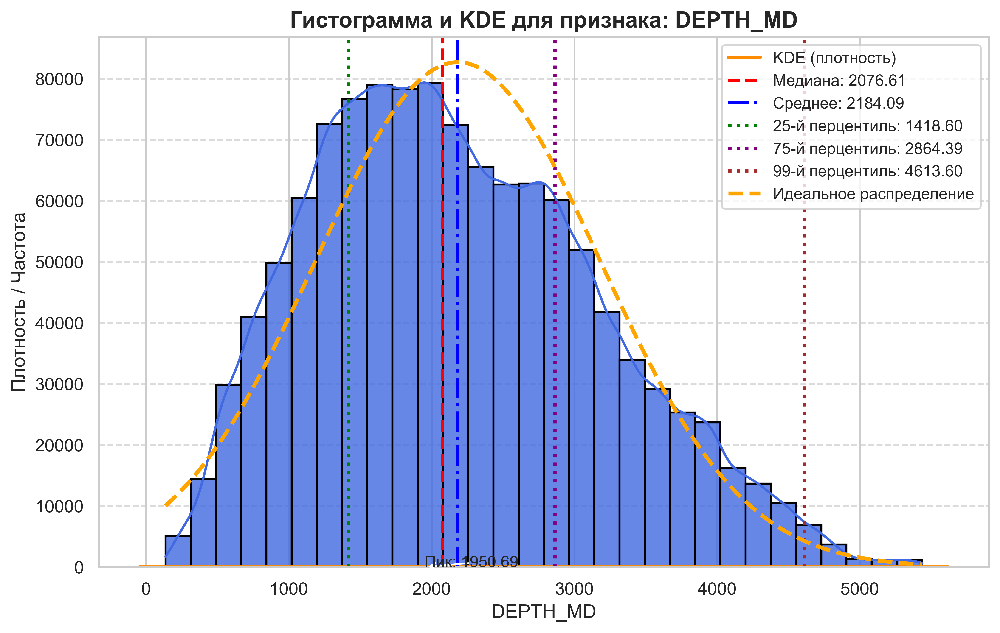

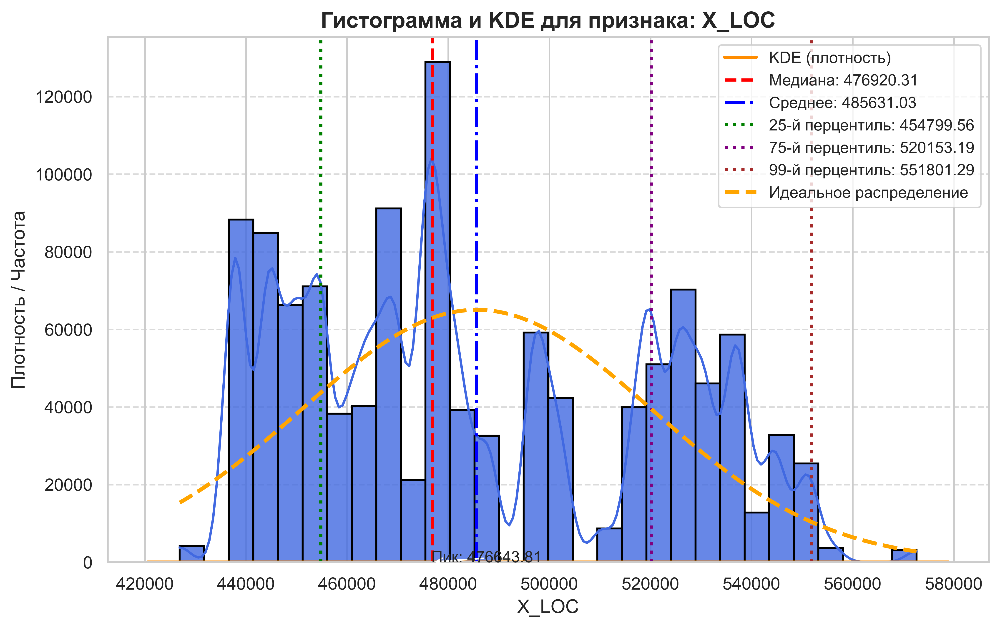

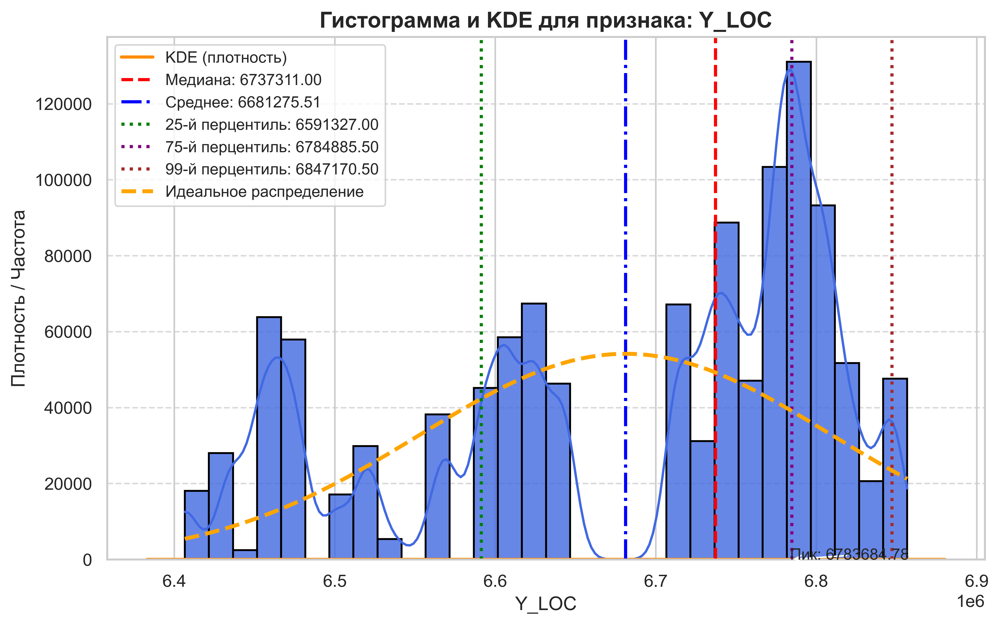

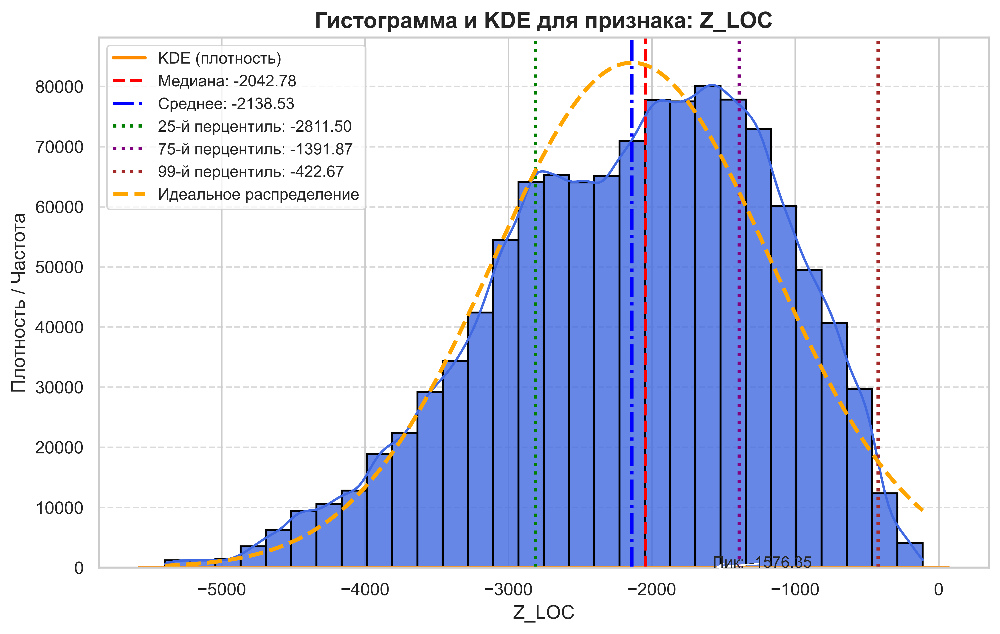

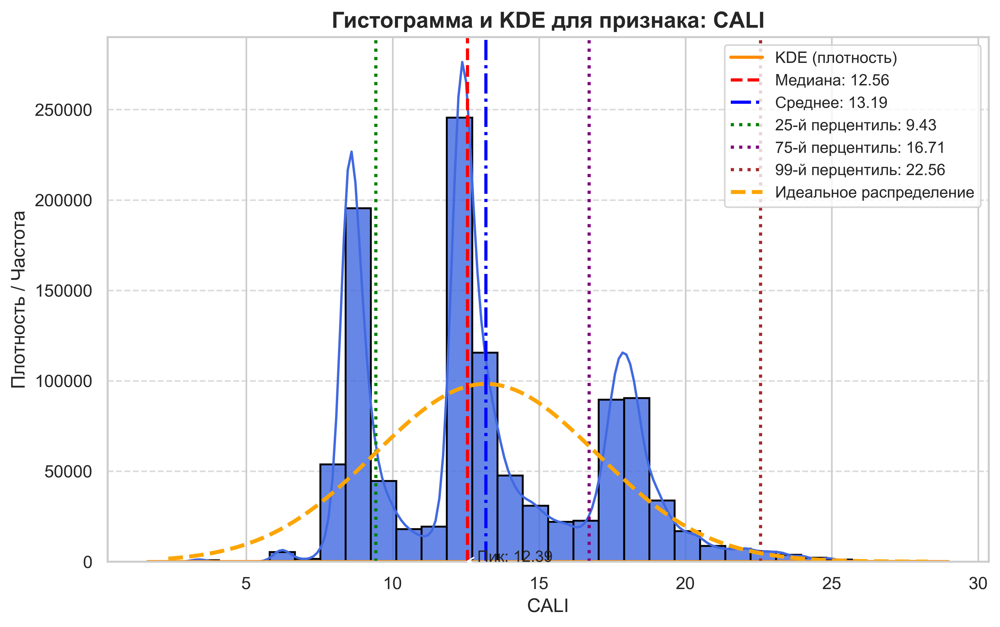

...

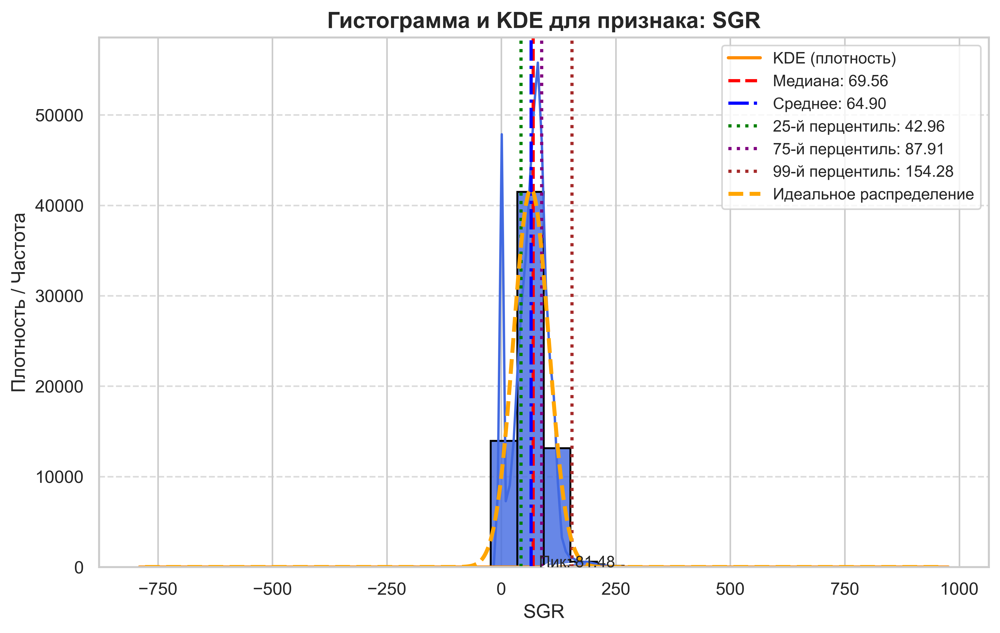

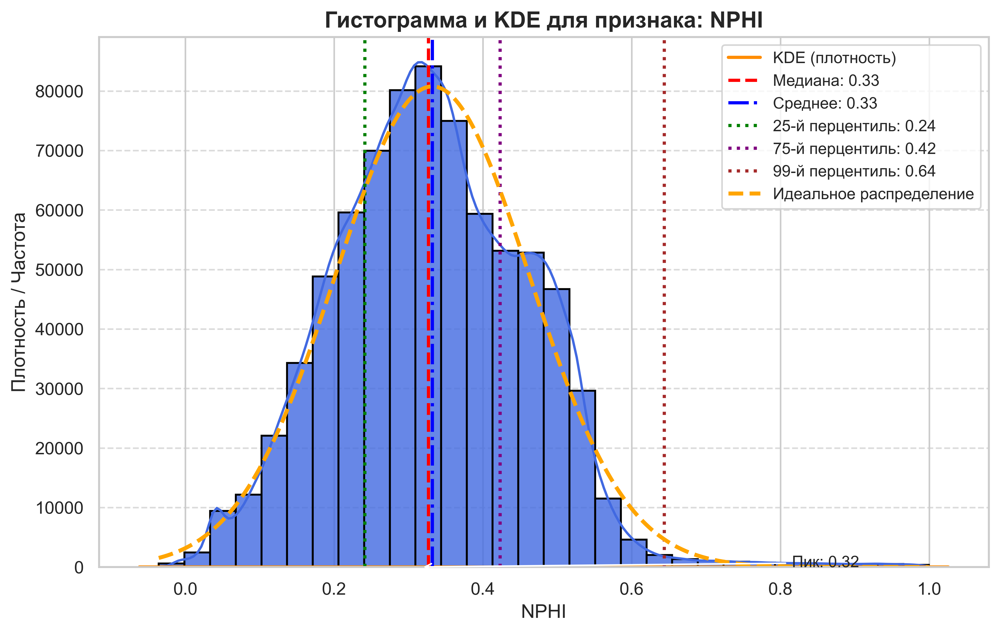

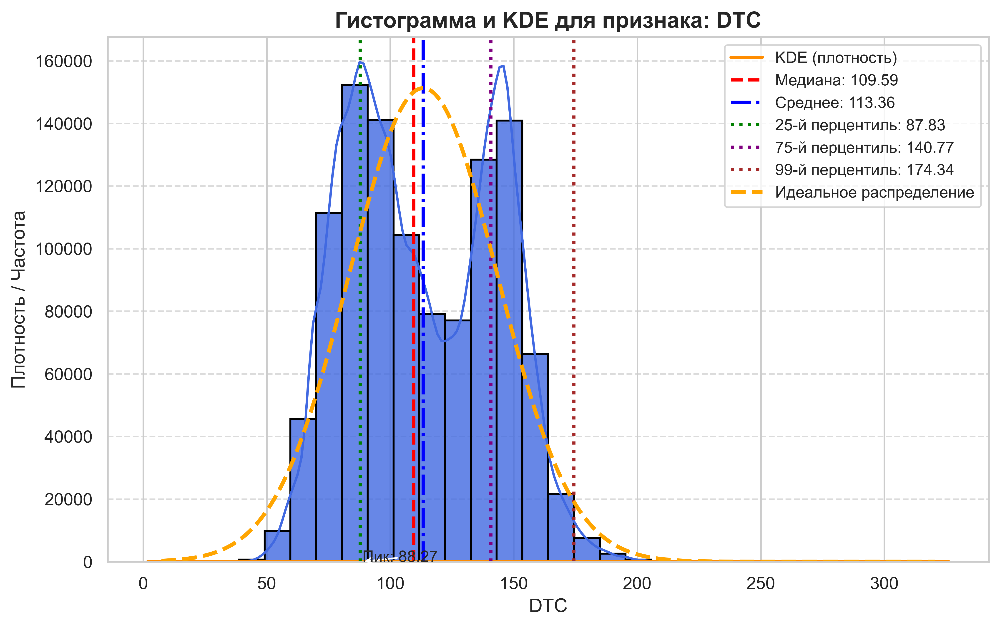

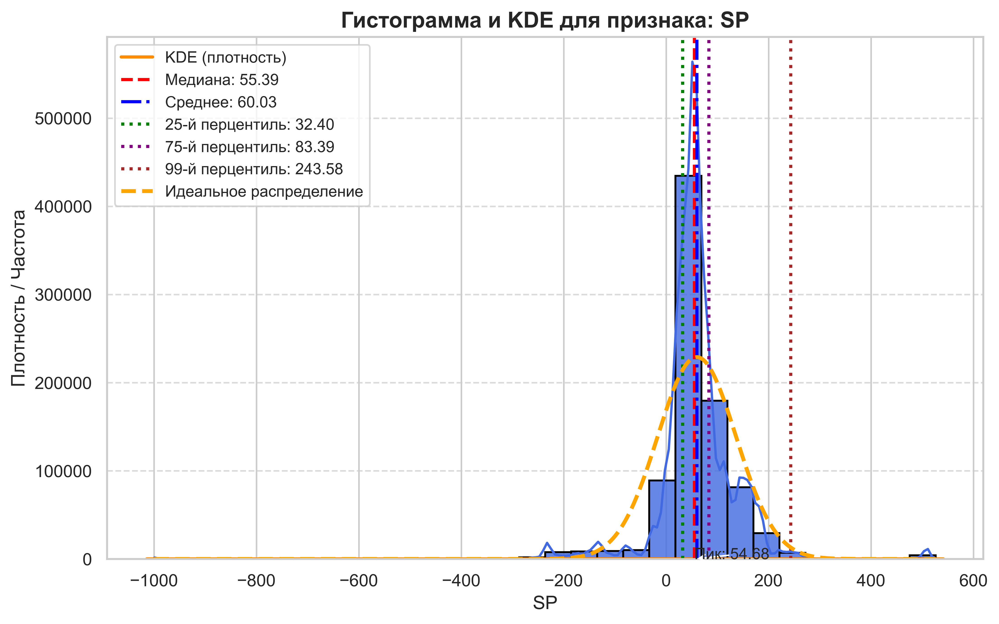

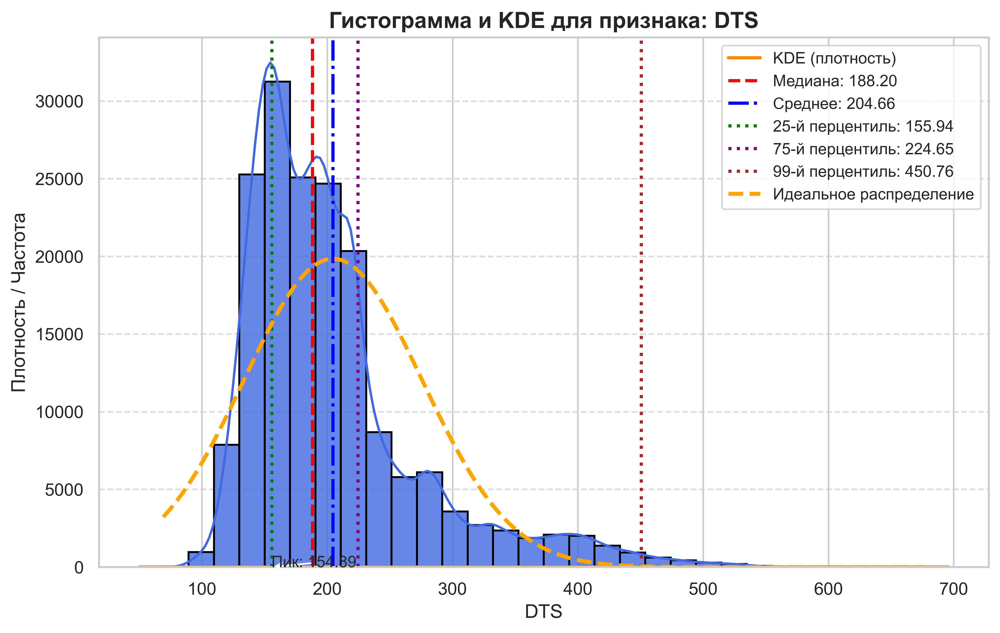

In [19]:
from scipy.stats import norm, gaussian_kde, kurtosis, skew


def plot_kde_distributions(df, numeric_columns):
    summary_data = []

    for column in numeric_columns:
        data = df[column].dropna()

        if data.nunique() <= 1:
            print(
                f"Пропущен график для столбца {column}, так как все значения одинаковы или отсутствует дисперсия."
            )
            continue

        plt.figure(figsize=(10, 6))

        ax = sns.histplot(
            data,
            kde=True,
            bins=30,
            edgecolor="black",
            color="royalblue",
            alpha=0.8,
            linewidth=1.2,
        )

        kde_color = "darkorange"
        sns.kdeplot(data, color=kde_color, linewidth=2, label="KDE (плотность)")

        plt.title(
            f"Гистограмма и KDE для признака: {column}",
            fontsize=14,
            fontweight="bold",
        )
        plt.xlabel(column, fontsize=12)
        plt.ylabel("Плотность / Частота", fontsize=12)
        plt.grid(axis="y", linestyle="--", alpha=0.7)

        median = data.median()
        mean = data.mean()
        std_dev = data.std()
        plt.axvline(
            median,
            color="red",
            linestyle="--",
            linewidth=2,
            label=f"Медиана: {median:.2f}",
        )
        plt.axvline(
            mean,
            color="blue",
            linestyle="-.",
            linewidth=2,
            label=f"Среднее: {mean:.2f}",
        )

        percentiles = [0.25, 0.75, 0.99]
        percentile_values = data.quantile(percentiles)
        perc_colors = ["green", "purple", "brown"]
        for perc, value, color in zip(percentiles, percentile_values, perc_colors):
            plt.axvline(
                value,
                color=color,
                linestyle=":",
                linewidth=2,
                label=f"{int(perc * 100)}-й перцентиль: {value:.2f}",
            )

        try:
            x_range = np.linspace(data.min(), data.max(), 1000)
            ideal_pdf = norm.pdf(x_range, loc=mean, scale=std_dev)
            ideal_pdf_scaled = ideal_pdf * len(data) * (data.max() - data.min()) / 30
            plt.plot(
                x_range,
                ideal_pdf_scaled,
                color="orange",
                linestyle="--",
                linewidth=2.5,
                label="Идеальное распределение",
            )
        except Exception as e:
            print(
                f"Ошибка при построении идеального распределения для столбца {column}: {e}"
            )

        peak_x = None
        try:
            kde = gaussian_kde(data)
            kde_values = kde(x_range)
            peak_x = x_range[np.argmax(kde_values)]
            peak_y = kde_values.max()

            plt.annotate(
                f"Пик: {peak_x:.2f}",
                xy=(peak_x, peak_y),
                xytext=(peak_x + 0.5, peak_y + 0.1),
                arrowprops=dict(facecolor="black", arrowstyle="->"),
                fontsize=10,
            )
        except np.linalg.LinAlgError:
            print(
                f"Не удалось построить KDE для столбца {column}, так как данные имеют низкую дисперсию."
            )

        plt.legend(fontsize=10)

        kurt = kurtosis(data)
        skewness = skew(data)

        if -0.5 <= skewness <= 0.5:
            distribution = "Нормальное"
        elif skewness > 0.5:
            distribution = "Смещенное вправо"
        elif skewness < -0.5:
            distribution = "Смещенное влево"
        else:
            distribution = "Неопределено"

        lower, upper = data.quantile(0.25), data.quantile(0.75)
        range_info = f"[{lower:.2f}, {upper:.2f}]"

        summary_data.append(
            {
                "Признак": column,
                "Эксцесс": round(kurt, 2),
                "Асимметрия": round(skewness, 2),
                "Пик": round(peak_x, 2) if peak_x is not None else None,
                "Среднее": round(mean, 2),
                "Медиана": round(median, 2),
                "25-й перцентиль": round(percentile_values[0.25], 2),
                "75-й перцентиль": round(percentile_values[0.75], 2),
                "99-й перцентиль": round(percentile_values[0.99], 2),
                "Распределение": range_info,
                "Вывод": distribution,
            }
        )

    summary_df = pd.DataFrame(summary_data)
    return summary_df


summary = plot_kde_distributions(
    df=data,
    numeric_columns=kde_cols,
)

summary

### Распределение признаков

*Унимодальные, близкие к нормальным*: `DEPTH_MD`, `Z_LOC`, `CALI`, `NPHI`, `DTC` – можно использовать стандартизацию (StandardScaler).

*Сильно смещенные*: 
* Смещенные влево: `Y_LOC`, `RHOB`, `SP`

* Смещенные вправо: `GR`, `SGR`, `DTC`

* Пиковые: `RSHA`, `RMED`, `RDEP`, `ROP`, `PEF`, `DCAL`, `MUDWEIGHT`, `RMIC`, `ROPA`, `RXO`

Расчет корреляций между GR, NPHI, RHOB и DTC

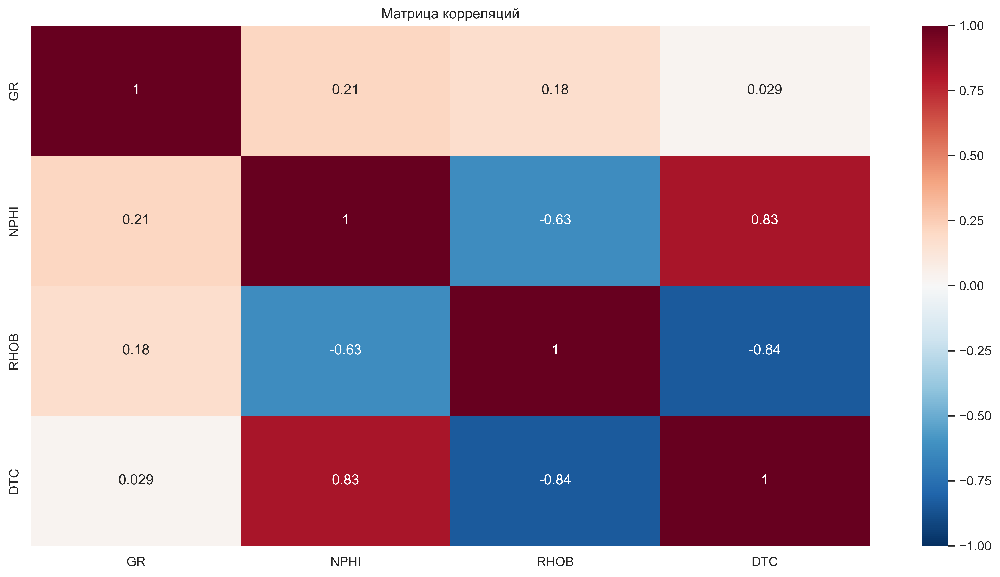

In [20]:
data_big_four = data[["GR", "NPHI", "RHOB", "DTC"]]

plt.figure(figsize=(16, 8))
sns.heatmap(data_big_four.corr('spearman'), annot=True, cmap="RdBu_r", center=0, vmin=-1, vmax=1)
plt.title("Матрица корреляций")
plt.show()

### Корреляционный анализ 

`RHOB – DTC`: Корреляция -0.84 (по Спирмену). Это классическая петрофизическая связь (плотность и время пробега акустической волны). Можно рассматривать как основу для восстановления одного через другое.

`NPHI – DTC`: Корреляция +0.79. Также сильная положительная связь.

`NPHI – RHOB`: Корреляция -0.62. Умеренная отрицательная связь.

**Summary:**
Для импутации можно построить регрессионную модель на основе сильных корреляций

Статистический анализ: расчет средних, отклонений, гистограмм

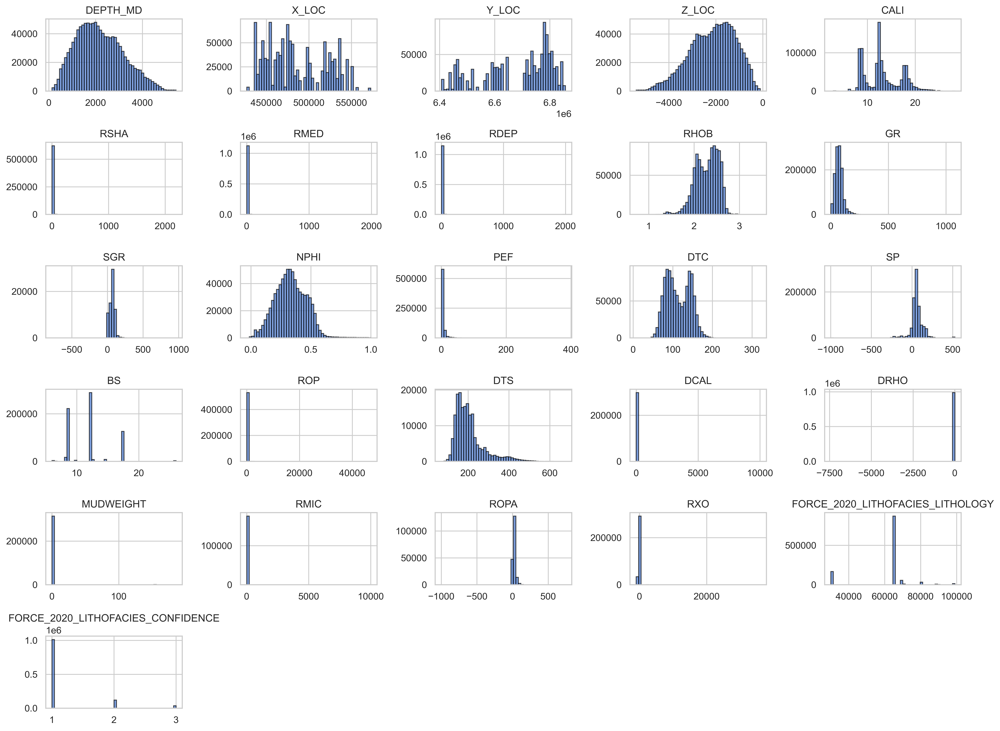

In [21]:
data.hist(figsize=(16, 12), bins=50, edgecolor="black", alpha=0.7)
plt.tight_layout()
plt.show()

Корреляционный анализ (Spearman). 

In [22]:
spearman_corr = num_data.corr(method="spearman")
plt.figure(figsize=(20, 16))
sns.heatmap(
    spearman_corr, annot=True, cmap="RdBu_r", center=0, vmin=-1, vmax=1, fmt=".2f"
)
plt.title("Матрица корреляций Спирмена")
plt.show()

### Связь признаков с таргетом

In [23]:
target = data["FORCE_2020_LITHOFACIES_LITHOLOGY"]
cat_cols = ["WELL", "GROUP", "FORMATION"]
cont_normal_cols = ['DEPTH_MD', 'Z_LOC', 'CALI', 'NPHI', 'DTC']
cont_skew_cols = ['Y_LOC', 'RHOB', 'SP', 'GR', 'SGR', 'DTS']

In [24]:
from scipy.stats import chi2_contingency

def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape

    if min(r, k) == 5: 
        phi2corr = max(0, phi2 - ((r - 1) * (k - 1)) / (n - 1))
        rcorr = r - ((r - 1) ** 2) / (n - 1)
        kcorr = k - ((k - 1) ** 2) / (n - 1)
        return np.sqrt(phi2corr / min(rcorr - 1, kcorr - 1))
    else:
        return np.sqrt(phi2 / min(r - 1, k - 1))


cramers_features = [
    "WELL",
    "GROUP",
    "FORMATION",
    "FORCE_2020_LITHOFACIES_CONFIDENCE",
]

results = {}

for col in cramers_features:
    cross_tab = pd.crosstab(data["FORCE_2020_LITHOFACIES_LITHOLOGY"], data[col])

    v = cramers_v(cross_tab.values)
    results[col] = v

print("Cramer's V для категориальных признаков:")
for k, v in sorted(results.items(), key=lambda x: x[1], reverse=True):
    print(f"{k}: {v:.3f}")

Cramer's V для категориальных признаков:
FORMATION: 0.467
FORCE_2020_LITHOFACIES_CONFIDENCE: 0.464
GROUP: 0.342
WELL: 0.257


In [25]:
from sklearn.feature_selection import mutual_info_classif

numeric_features = [
    "GR",
    "NPHI",
    "RHOB",
    "DTC",
    "DEPTH_MD",
    "CALI",
    "SP",
    "DTS",
    "PEF",
    "RXO",
    "ROP",
] 

X_num = data[numeric_features].fillna(0)
y = data["FORCE_2020_LITHOFACIES_LITHOLOGY"]

mi_scores = mutual_info_classif(X_num, y, random_state=42)

mi_df = pd.DataFrame({"Feature": numeric_features, "Mutual_Info": mi_scores})
mi_df = mi_df.sort_values(by="Mutual_Info", ascending=False)

mi_df

,Feature,Mutual_Info
0,GR,0.218712
5,CALI,0.184296
3,DTC,0.159139
1,NPHI,0.147657
10,ROP,0.119997
2,RHOB,0.098416
4,DEPTH_MD,0.078934
6,SP,0.077667
8,PEF,0.049907
7,DTS,0.032130


In [26]:
from scipy import stats
import pandas as pd

cont_skew_cols = ["Y_LOC", "RHOB", "SP", "GR", "SGR", "DTS"]

target_col = "FORCE_2020_LITHOFACIES_LITHOLOGY"

results_kruskal = []

for col in cont_skew_cols:
    subset = data[[col, target_col]].dropna()
    groups = [group[col].values for name, group in subset.groupby(target_col)]
    h_stat, p_value = stats.kruskal(*groups)
    results_kruskal.append({"Feature": col, "H_Statistic": h_stat, "p_value": p_value})

df_kruskal = pd.DataFrame(results_kruskal)
df_kruskal = df_kruskal.sort_values(by="H_Statistic", ascending=False)

df_kruskal.round(4)

,Feature,H_Statistic,p_value
3,GR,315547.6929,0.0
1,RHOB,99624.2753,0.0
0,Y_LOC,84301.1525,0.0
5,DTS,47477.7630,0.0
4,SGR,14619.7647,0.0
2,SP,7677.9919,0.0
